### [Load Models]

[generator loaded]
[encoder loaded]
generated samples:


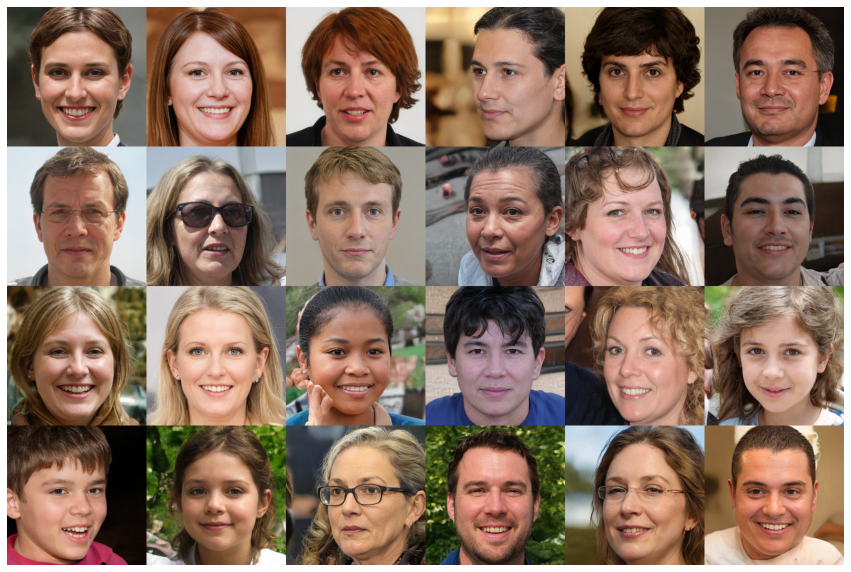

In [1]:
import os
import random
import numpy as np

import torch
from torch import nn
import torch.nn.functional as F

import torchvision
from torchvision import datasets, transforms

from model import Generator, Encoder
from train_encoder import VGGLoss

import matplotlib.pyplot as plt


def image2tensor(image):
    image = torch.FloatTensor(image).permute(2,0,1).unsqueeze(0)/255.
    return (image-0.5)/0.5

def tensor2image(tensor):
    tensor = tensor.clamp_(-1., 1.).detach().squeeze().permute(1,2,0).cpu().numpy()
    return tensor*0.5 + 0.5

def imshow(img, size=5, cmap='jet'):
    plt.figure(figsize=(size,size))
    plt.imshow(img, cmap=cmap)
    plt.axis('off')
    plt.show()


device = 'cuda'
image_size=256

g_model_path = './checkpoint/generator_ffhq.pt'
g_ckpt = torch.load(g_model_path, map_location=device)

latent_dim = g_ckpt['args'].latent

generator = Generator(image_size, latent_dim, 8).to(device)
generator.load_state_dict(g_ckpt["g_ema"], strict=False)
generator.eval()
print('[generator loaded]')

e_model_path = './checkpoint/encoder_ffhq.pt'
e_ckpt = torch.load(e_model_path, map_location=device)

encoder = Encoder(image_size, latent_dim).to(device)
encoder.load_state_dict(e_ckpt['e'])
encoder.eval()
print('[encoder loaded]')

truncation = 0.7
trunc = generator.mean_latent(4096).detach().clone()

with torch.no_grad():
    latent = generator.get_latent(torch.randn(4*6, latent_dim, device=device))
    imgs_gen, _ = generator([latent],
                              truncation=truncation,
                              truncation_latent=trunc,
                              input_is_latent=True,
                              randomize_noise=True)

    result = []
    for row in imgs_gen.chunk(4, dim=0):
        result.append(torch.cat([img for img in row], dim=2))
    result = torch.cat(result, dim=1)
    print('generated samples:')
    imshow(tensor2image(result), size=15)

### [Domain-Guided Encoder]

initial projections:


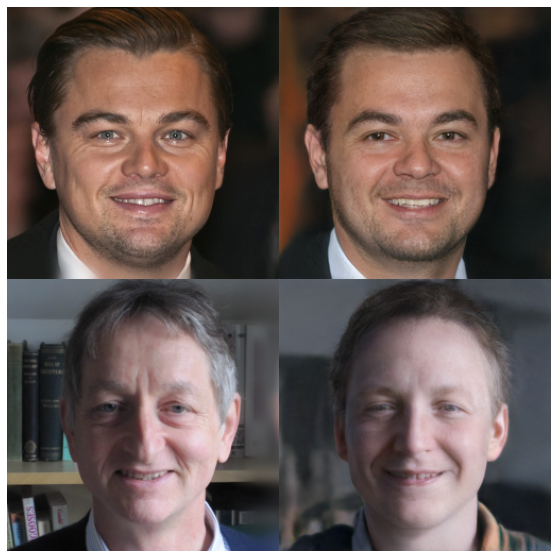

In [3]:
batch_size = 2

transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

dataset = datasets.ImageFolder(root='./examples', transform=transform)
loader = iter(torch.utils.data.DataLoader(dataset=dataset, batch_size=batch_size, shuffle=True))

imgs, _ = next(loader)
imgs = imgs.to(device)

with torch.no_grad():
    z0 = encoder(imgs)
    imgs_gen, _ =  generator([z0], 
                           input_is_latent=True,
                           truncation=truncation,
                           truncation_latent=trunc,
                           randomize_noise=False)

imgs_real = torch.cat([img for img in imgs], dim=1)
imgs_fakes = torch.cat([img_gen for img_gen in imgs_gen], dim=1)

print('initial projections:')
imshow(tensor2image(torch.cat([imgs_real, imgs_fakes], dim=2)),10)

initial projections:


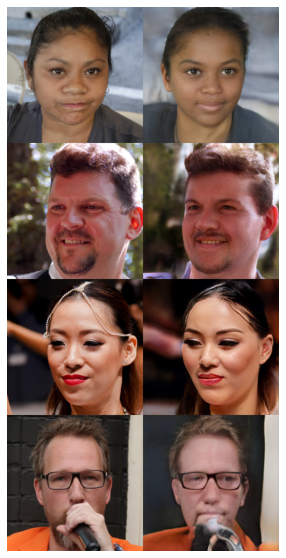

In [2]:
# In-Domain Images
batch_size = 4

transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

dataset = datasets.ImageFolder(root='./ffhq', transform=transform)
loader = iter(torch.utils.data.DataLoader(dataset=dataset, batch_size=batch_size, shuffle=True))

imgs, _ = next(loader)
imgs = imgs.to(device)

with torch.no_grad():
    z0 = encoder(imgs)
    imgs_gen, _ =  generator([z0], 
                           input_is_latent=True,
                           truncation=truncation,
                           truncation_latent=trunc,
                           randomize_noise=False)

imgs_real = torch.cat([img for img in imgs], dim=1)
imgs_fakes = torch.cat([img_gen for img_gen in imgs_gen], dim=1)

print('initial projections:')
imshow(tensor2image(torch.cat([imgs_real, imgs_fakes], dim=2)),10)

In [3]:
from typing import Type, Any, Callable, Union, List, Optional

class ResNetWrapper(nn.Module):
    def __init__(
        self,
        model,
    ):
        super().__init__()
        self.model = model

    def forward(self, x):
        x = self.model.conv1(x)
        x = self.model.bn1(x)
        x = self.model.relu(x)
        x = self.model.maxpool(x)

        x = self.model.layer1(x)
        x = self.model.layer2(x)
        x = self.model.layer3(x)
        x = self.model.layer4(x)

        x = self.model.avgpool(x)
        return x

In [4]:
def toggle_grad(model, on_or_off):
    for param in model.parameters():
        param.requires_grad = on_or_off


In [7]:
# load SimCLR encoder
model = torchvision.models.resnet18(pretrained=False, num_classes=10).to(device)
checkpoint = torch.load('checkpoint/checkpoint_0100.pth.tar', map_location=device)
state_dict = checkpoint['state_dict']
for k in list(state_dict.keys()):
    if k.startswith('backbone.'):
        if k.startswith('backbone') and not k.startswith('backbone.fc'):
            # remove prefix
            state_dict[k[len("backbone."):]] = state_dict[k]
    del state_dict[k]
log = model.load_state_dict(state_dict, strict=False)
assert log.missing_keys == ['fc.weight', 'fc.bias']

In [5]:
# SimSiam encoder
import torchvision.models as models
model = models.__dict__['resnet50']()
# from resnet import resnet50
# model = resnet50()
checkpoint = torch.load('checkpoint/checkpoint_0099.pth.tar', map_location=device)
# rename moco pre-trained keys
state_dict = checkpoint['state_dict']
for k in list(state_dict.keys()):
    # retain only encoder up to before the embedding layer
    if k.startswith('module.encoder') and not k.startswith('module.encoder.fc'):
        # remove prefix
        state_dict[k[len("module.encoder."):]] = state_dict[k]
    # delete renamed or unused k
    del state_dict[k]
msg = model.load_state_dict(state_dict, strict=False)
assert set(msg.missing_keys) == {"fc.weight", "fc.bias"}
model = ResNetWrapper(model).to(device)

step:100, loss:19.881908416748047


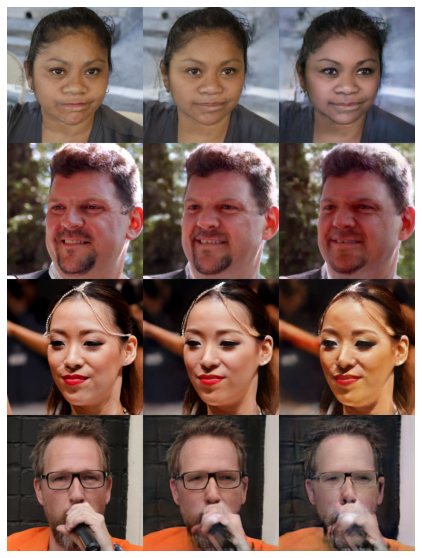

step:200, loss:19.86279296875


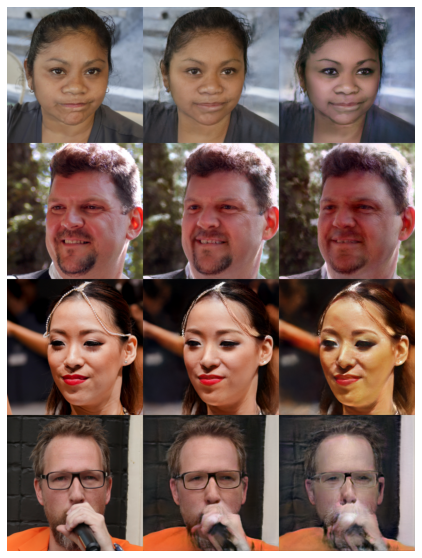

step:300, loss:19.851909637451172


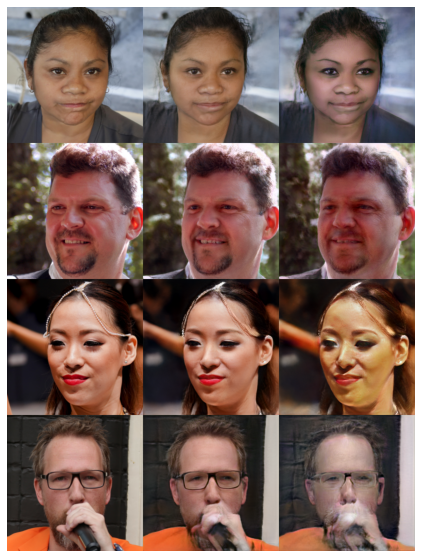

step:400, loss:19.844486236572266


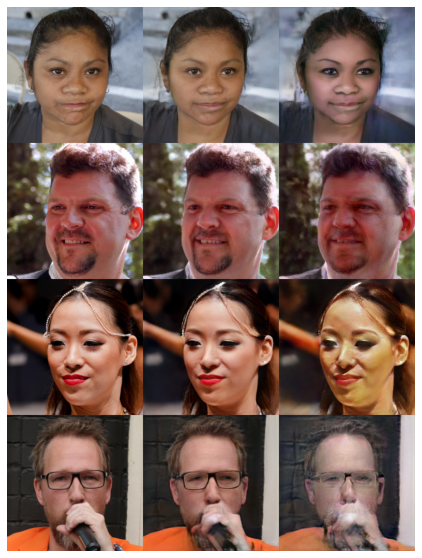

step:500, loss:19.838651657104492


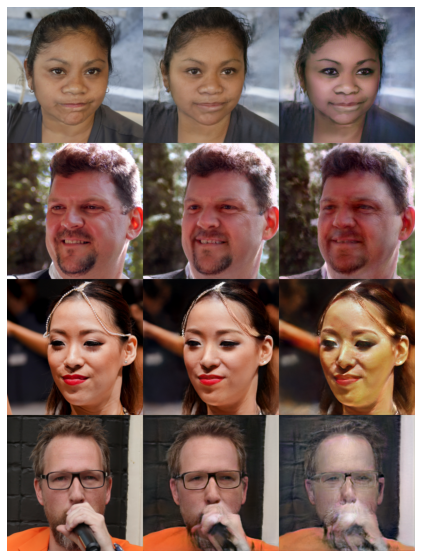

step:600, loss:19.834022521972656


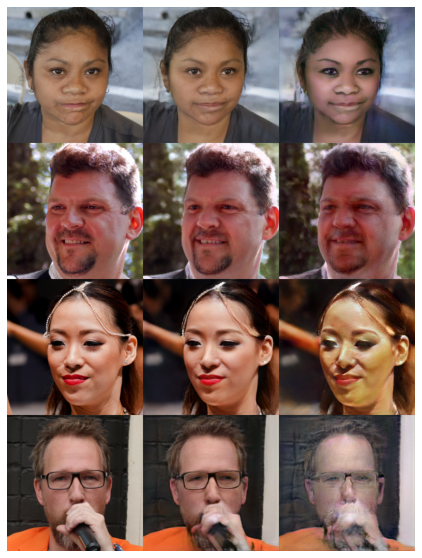

step:700, loss:19.830368041992188


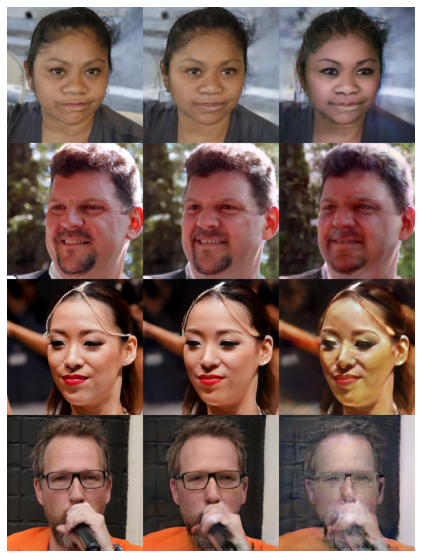

step:800, loss:19.827259063720703


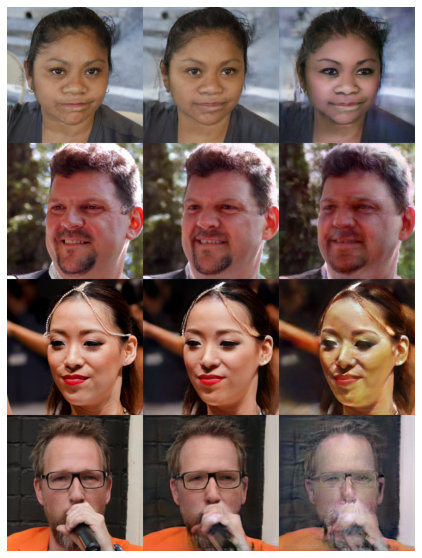

step:900, loss:19.824390411376953


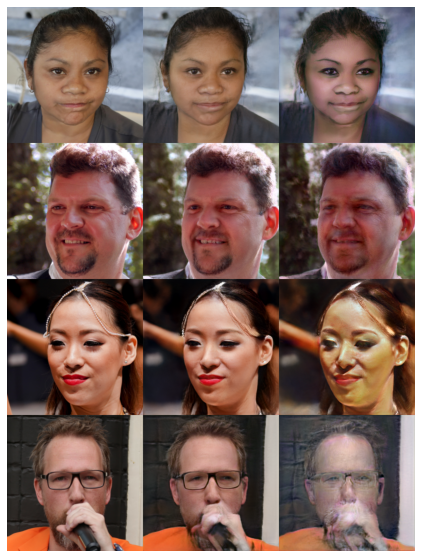

step:1000, loss:19.822011947631836


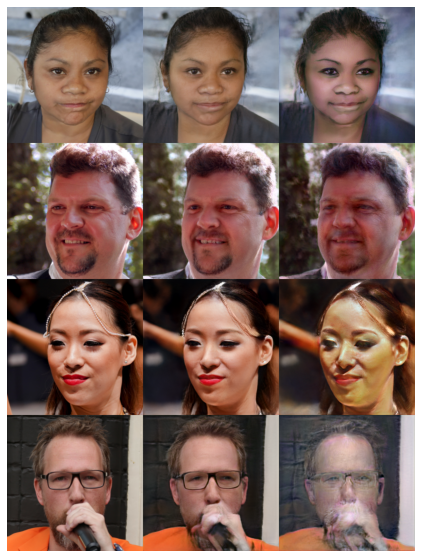

In [7]:
# generating views!
import pdb
st = pdb.set_trace

# z = z0.detach().clone()  # warm start
z = z1.detach().clone()  # warm start
imgs_rec, _ = generator([z],
                        input_is_latent=True,
                        truncation=truncation,
                        truncation_latent=trunc, 
                        randomize_noise=False)
imgs_recon = torch.cat([img_rec for img_rec in imgs_rec], dim=1)

z.requires_grad = True
optimizer = torch.optim.Adam([z], lr=0.005)

toggle_grad(model, False)
toggle_grad(generator, False)

h_img = model(imgs)  # precompute
h_img = h_img.squeeze()

eps = 20

for step in range(1000):
    imgs_gen, _ = generator([z], 
                            input_is_latent=True, 
                            truncation=truncation,
                            truncation_latent=trunc, 
                            randomize_noise=False)

    h_gen = model(imgs_gen)
    h_gen = h_gen.squeeze()
    loss = torch.mean(F.relu(eps - torch.norm(h_gen - h_img, dim=1)))
    # print(step, loss)
    if loss.item() > 0.:
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    else:
        print("loss is zero!")
        break

    if (step+1)%100 == 0:
        print(f'step:{step+1}, loss:{loss.item()}')
        imgs_fakes = torch.cat([img_gen for img_gen in imgs_gen], dim=1)        
        imshow(tensor2image(torch.cat([imgs_real, imgs_recon, imgs_fakes], dim=2)),10)

step:100, loss:16.62074851989746


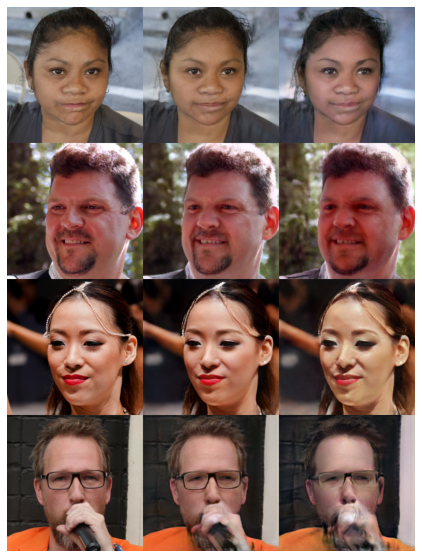

step:200, loss:16.047760009765625


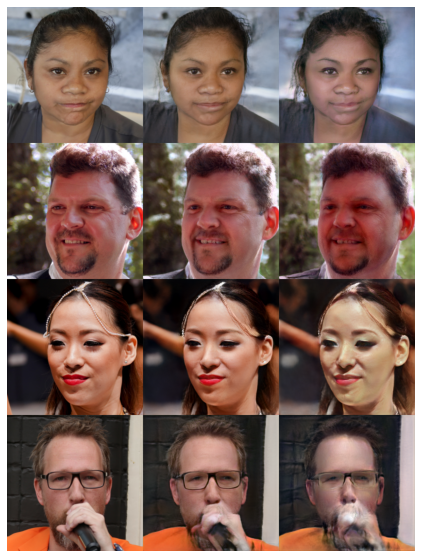

step:300, loss:15.749429702758789


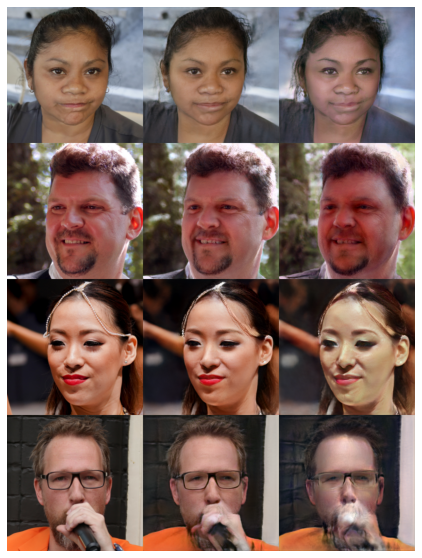

step:400, loss:15.549234390258789


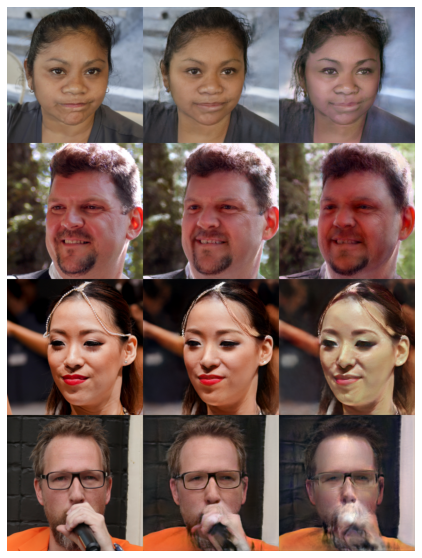

step:500, loss:15.393509864807129


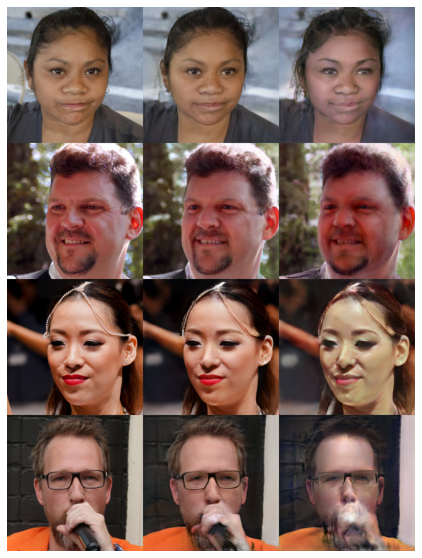

step:600, loss:15.26776123046875


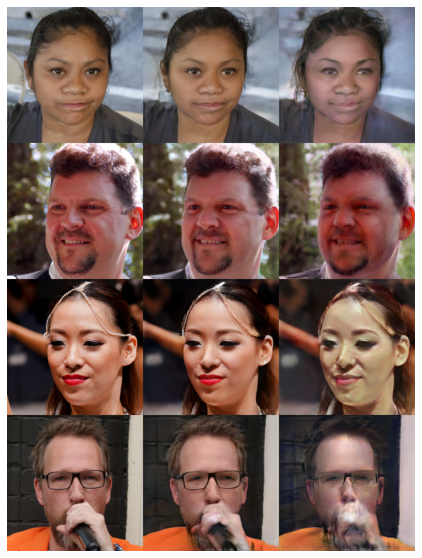

step:700, loss:15.165091514587402


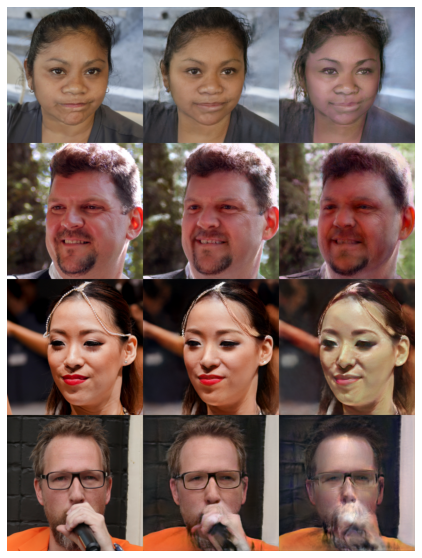

step:800, loss:15.080307960510254


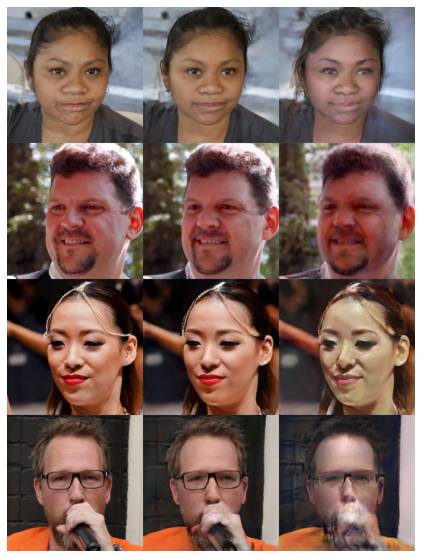

step:900, loss:15.006495475769043


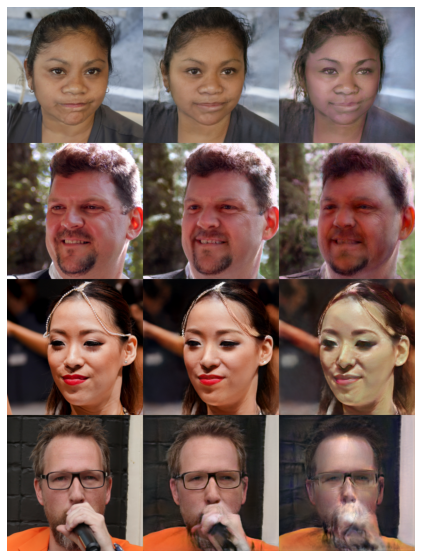

step:1000, loss:14.945802688598633


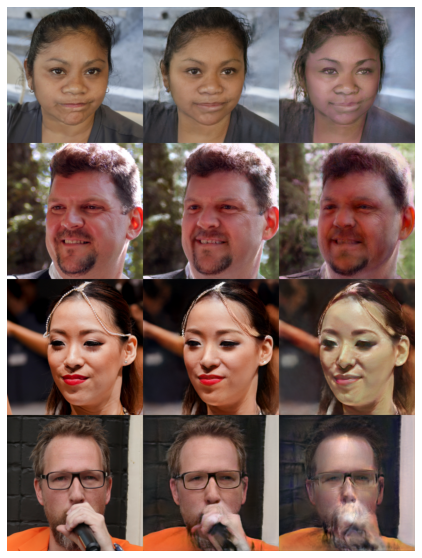

In [8]:
# generating views!
import pdb
st = pdb.set_trace

# z = z0.detach().clone()  # warm start
z = z1.detach().clone()  # warm start
imgs_rec, _ = generator([z],
                        input_is_latent=True,
                        truncation=truncation,
                        truncation_latent=trunc, 
                        randomize_noise=False)
imgs_recon = torch.cat([img_rec for img_rec in imgs_rec], dim=1)

z.requires_grad = True
optimizer = torch.optim.Adam([z], lr=0.005)

toggle_grad(model, False)
toggle_grad(generator, False)

h_img = model(imgs)  # precompute
h_img = h_img.squeeze()

eps = 20

for step in range(1000):
    imgs_gen, _ = generator([z], 
                           input_is_latent=True, 
                           truncation=truncation,
                           truncation_latent=trunc, 
                           randomize_noise=False)

    h_gen = model(imgs_gen)
    h_gen = h_gen.squeeze()
    loss = torch.mean(F.relu(eps - torch.norm(h_gen - h_img, dim=1, p=1)))
    # print(step, loss)
    if loss.item() > 0.:
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    else:
        print("loss is zero!")
        break

    if (step+1)%100 == 0:
        print(f'step:{step+1}, loss:{loss.item()}')
        imgs_fakes = torch.cat([img_gen for img_gen in imgs_gen], dim=1)        
        imshow(tensor2image(torch.cat([imgs_real, imgs_recon, imgs_fakes], dim=2)),10)

In [62]:
ckpt = torch.load('../../dresden/Active/stylegan2-pytorch/logs/0328_gan_c10_avg/weight/latest.pt')

In [75]:
from model import Generator
generator = Generator(32, 512, 8, 2).to(device)
generator.load_state_dict(ckpt["g_ema"], strict=True)
# generator.eval()

<All keys matched successfully>

### [In-Domain Inversion]

step:100, loss:2.2376601696014404


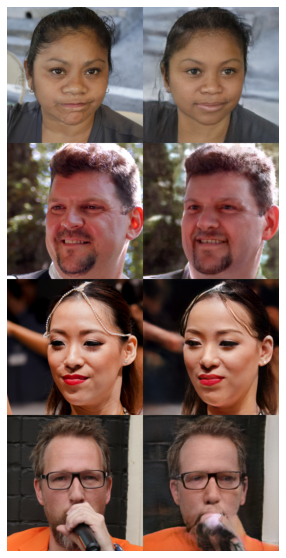

step:200, loss:1.9844245910644531


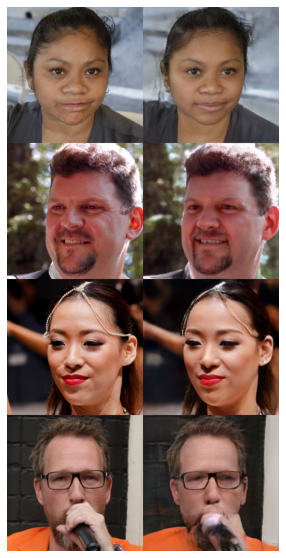

step:300, loss:1.8273588418960571


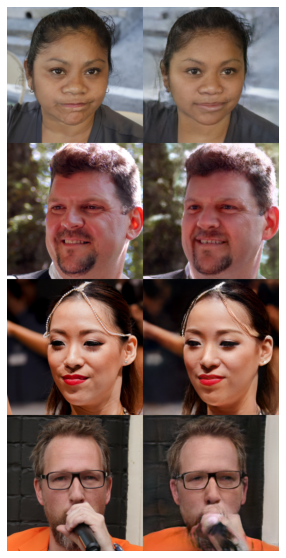

step:400, loss:1.7274589538574219


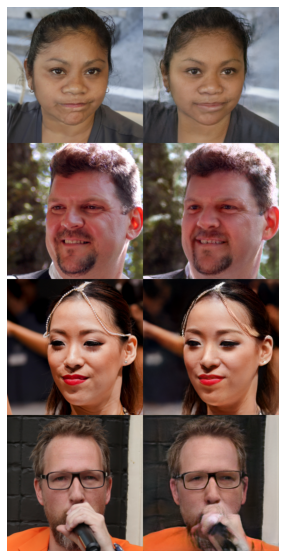

step:500, loss:1.6544908285140991


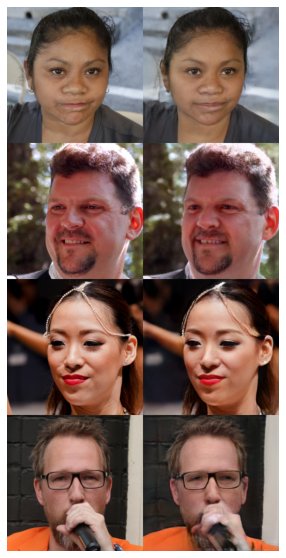

In [6]:
vgg_loss = VGGLoss(device)

z = z0.detach().clone()

z.requires_grad = True
optimizer = torch.optim.Adam([z], lr=0.01)

for step in range(500):
    imgs_gen, _ = generator([z], 
                           input_is_latent=True, 
                           truncation=truncation,
                           truncation_latent=trunc, 
                           randomize_noise=False)

    z_hat = encoder(imgs_gen)
    
    loss = F.mse_loss(imgs_gen, imgs) + vgg_loss(imgs_gen, imgs) + F.mse_loss(z0, z_hat)*2.0
    
    optimizer.zero_grad()
    loss.backward()
    optimizer.step() 
    
    if (step+1)%100 == 0:
        print(f'step:{step+1}, loss:{loss.item()}')
        imgs_fakes = torch.cat([img_gen for img_gen in imgs_gen], dim=1)        
        imshow(tensor2image(torch.cat([imgs_real, imgs_fakes], dim=2)),10)

z1 = z.detach().clone()

### [Interpolation]

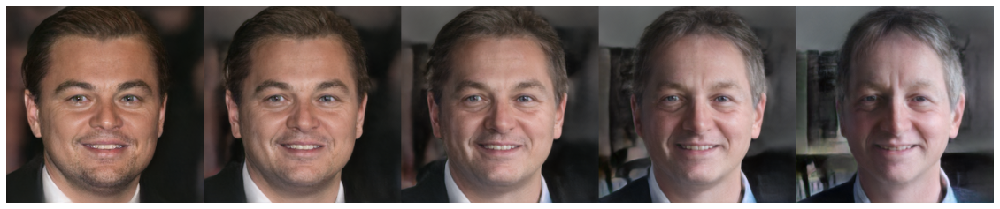

In [5]:
n_interp = 5
latent_interp = torch.zeros(n_interp, z.shape[1], z.shape[2]).to(device)

with torch.no_grad():
    for j in range(n_interp):
        latent_interp[j] = (float(n_interp-j-1) * z[0] + float(j) * z[1])/(n_interp-1)
    
        imgs_gen, _ = generator([latent_interp],
                                input_is_latent=True,                                     
                                truncation=truncation,
                                truncation_latent=trunc,
                                randomize_noise=False)

imshow(tensor2image(torch.cat([img_gen for img_gen in imgs_gen], dim=2)), 20)
